<a href="https://colab.research.google.com/github/poltorashka-s-BMa/course-os-linux/blob/main/sist_biol.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

ЗАДАЧА 1

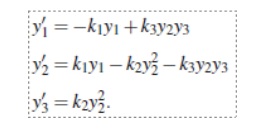

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from matplotlib.ticker import LogLocator, NullFormatter


In [ ]:
#Определяем систему дифференциальных уравнений
def system(t, y, k1, k2, k3):
    y1, y2, y3 = y
    dy1dt = -k1 * y1 + k3 * y2 * y3
    dy2dt = k1 * y1 - k2 * y2**2 - k3 * y2 * y3
    dy3dt = k2 * y2**2
    return [dy1dt, dy2dt, dy3dt]


In [ ]:
# Параметры
k1 = 0.04
k2 = 3.0e7 #Очень большой коэффициент
k3 = 1.0e4

# Начальные условия
y0 = [1.0, 0.0, 0.0]

In [ ]:
# Решение для короткого интервала времени (0 ≤ t ≤ 40)
t_span_short = (0, 40)
sol_short = solve_ivp(system, t_span_short, y0, args=(k1, k2, k3),
                      method='BDF', rtol=1e-6, atol=1e-9)

In [ ]:
# Решение для длинного интервала времени (1e-4 ≤ t ≤ 1e7)
t_span_long = (1e-4, 1e7)
sol_long = solve_ivp(system, t_span_long, y0, args=(k1, k2, k3),
                     method='BDF', rtol=1e-6, atol=1e-9)


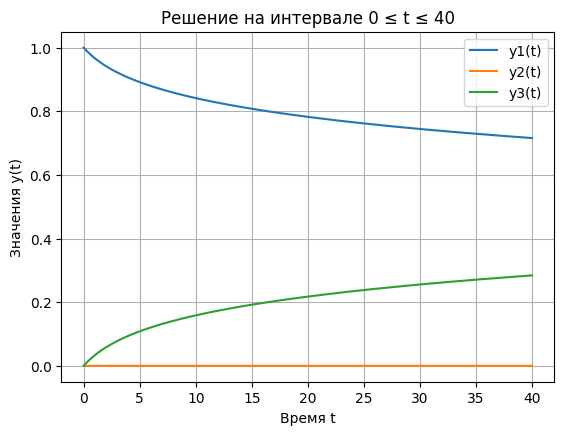

In [ ]:

plt.figure(figsize=(14, 10))

# График для короткого интервала
plt.subplot(2, 2, 1)
plt.plot(sol_short.t, sol_short.y[0], label='y1(t)')
plt.plot(sol_short.t, sol_short.y[1], label='y2(t)')
plt.plot(sol_short.t, sol_short.y[2], label='y3(t)')
plt.title('Решение на интервале 0 ≤ t ≤ 40')
plt.xlabel('Время t')
plt.ylabel('Значения y(t)')
plt.legend()
plt.grid()

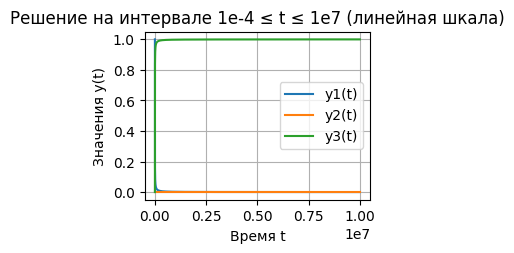

In [ ]:
# График для длинного интервала (линейная шкала)
plt.subplot(2, 2, 2)
plt.plot(sol_long.t, sol_long.y[0], label='y1(t)')
plt.plot(sol_long.t, sol_long.y[1], label='y2(t)')
plt.plot(sol_long.t, sol_long.y[2], label='y3(t)')
plt.title('Решение на интервале 1e-4 ≤ t ≤ 1e7 (линейная шкала)')
plt.xlabel('Время t')
plt.ylabel('Значения y(t)')
plt.legend()
plt.grid()


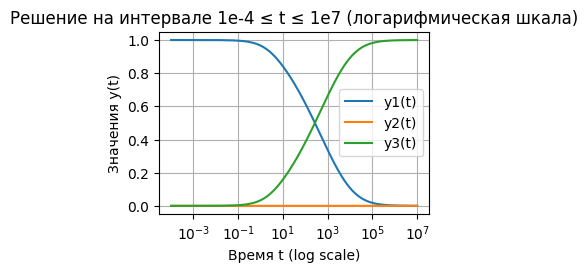

In [ ]:

#График для длинного интервала (логарифмическая шкала)
plt.subplot(2, 2, 3)
plt.semilogx(sol_long.t, sol_long.y[0], label='y1(t)')
plt.semilogx(sol_long.t, sol_long.y[1], label='y2(t)')
plt.semilogx(sol_long.t, sol_long.y[2], label='y3(t)')
plt.title('Решение на интервале 1e-4 ≤ t ≤ 1e7 (логарифмическая шкала)')
plt.xlabel('Время t (log scale)')
plt.ylabel('Значения y(t)')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

Уравнения могут описывать, например, химическую реакцию с тремя веществами:

y
1
y
1
​
  — концентрация исходного реагента,

y
2
y
2
​
  — концентрация промежуточного продукта,

y
3
y
3
​
  — концентрация конечного продукта.

Скорости реакций определяются коэффициентами
k
1
,
k
2
,
k
3
k
1
​
 ,k
2
​
 ,k
3
​
 :

k
1
k
1
​
  — скорость превращения
y
1
y
1
​
  в
y
2
y
2
​
 ,

k
2
k
2
​
  — скорость превращения
y
2
y
2
​
  в
y
3
y
3
​
  (очень быстрая реакция, т. к.
k
2
=
3
⋅
10
7
k
2
​
 =3⋅10
7
 ),

k
3
k
3
​
  — скорость обратной реакции между
y
2
y
2
​
  и
y
3
y
3
​
 .

Задача 2

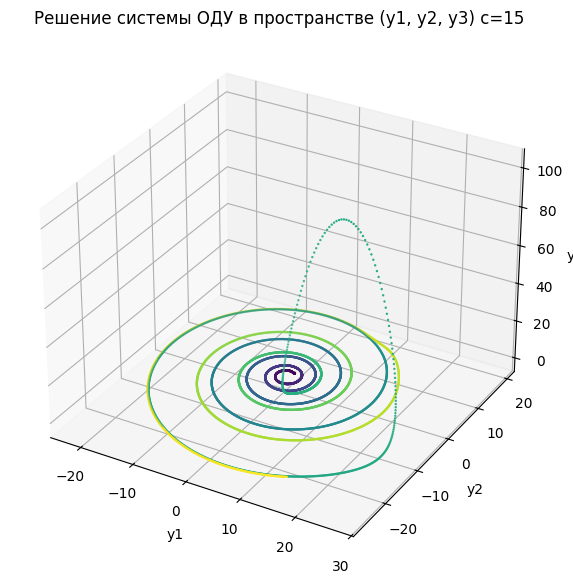

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.integrate import solve_ivp

# Параметры
a = 0.2
b = 0.2
c = 15

# Система уравнений
def system(t, y):
    y1, y2, y3 = y
    dy1 = -y2 - y3
    dy2 = y1 + a * y2
    dy3 = b + y3 * (y1 - c)
    return [dy1, dy2, dy3]

# Начальные условия
y0 = [1, 1, 1]

# Интервал интегрирования
t_span = (0, 50)
t_eval = np.linspace(*t_span, 10000)

# Решаем систему
sol = solve_ivp(system, t_span, y0, t_eval=t_eval)

# Визуализация: scatterplot3d
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(sol.y[0], sol.y[1], sol.y[2], c=t_eval, cmap='viridis', s=0.5)
ax.set_xlabel('y1')
ax.set_ylabel('y2')
ax.set_zlabel('y3')
ax.set_title('Решение системы ОДУ в пространстве (y1, y2, y3) c=15')
plt.show()


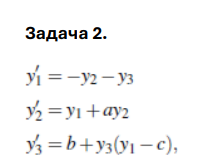

Начальные условия:

𝑦
(
0
)
=
(
1
,
1
,
1
)
y(0)=(1,1,1)
Параметры:

𝑎
=
0.2
,
𝑏
=
0.2
,
𝑐
=
5
a=0.2,b=0.2,c=5

y
1
​
 ,y
2
​
 ,y
3
​
  — функции времени
𝑡
t

Производные этих функций заданы через другие переменные и параметры.

Это может описывать некий динамический процесс, возможно, хаотическую или биологическую

1. Параметр
𝑎
a: коэффициент усиления/затухания для
𝑦
2
y
2
​

Уравнение:

𝑦
2
′
=
𝑦
1
+
𝑎
𝑦
2
y
2
′
​
 =y
1
​
 +ay
2
​

Если
𝑎
>
0
a>0 — вклад
𝑦
2
y
2
​
  усиливается во времени (экспоненциальный рост).

Если
𝑎
<
0
a<0 —
𝑦
2
y
2
​
  затухает со временем.

В данном случае
𝑎
=
0.2
a=0.2 — небольшой рост, положительная обратная связь.

 Можно считать, что
𝑎
a регулирует устойчивость/неустойчивость второго компонента системы.

2. Параметр
𝑏
b: внешняя постоянная "подача" в уравнении для
𝑦
3
y
3
​

Уравнение:

𝑦
3
′
=
𝑏
+
𝑦
3
(
𝑦
1
−
𝑐
)
y
3
′
​
 =b+y
3
​
 (y
1
​
 −c)
𝑏
b — постоянный внешний приток к переменной
𝑦
3
y
3
​
 .

Даже если всё остальное ноль,
𝑦
3
y
3
​
  будет расти линейно:
𝑦
3
′
=
𝑏
y
3
′
​
 =b.

 Это аналог внешней энергии или источника, который "запускает" динамику третьей переменной.

3. Параметр
𝑐
c: критическое значение
𝑦
1
y
1
​

Входит в выражение
𝑦
3
(
𝑦
1
−
𝑐
)
y
3
​
 (y
1
​
 −c)

Если
𝑦
1
>
𝑐
y
1
​
 >c, то
𝑦
3
y
3
​
  усиливается экспоненциально (если
𝑦
3
>
0
y
3
​
 >0).

 Это порог: как только
𝑦
1
y
1
​
  превышает значение
𝑐
=
5
c=5, начинает происходить резкий рост или спад
𝑦
3
y
3
​
 , в зависимости от знака.

 Итог:
Параметр	Значение	Интерпретация
𝑎
=
0.2
a=0.2	Усиление	Мягкий рост/неустойчивость в
𝑦
2
y
2
​

𝑏
=
0.2
b=0.2	Внешний источник	Постоянный "впрыск" в
𝑦
3
y
3
​

𝑐
=
5
c=5	Пороговое значение	Контролирует переключение в поведении
𝑦
3
y
3
​


ЗАДАЧА 3 хищник жертва

In [ ]:
pip install ddeint


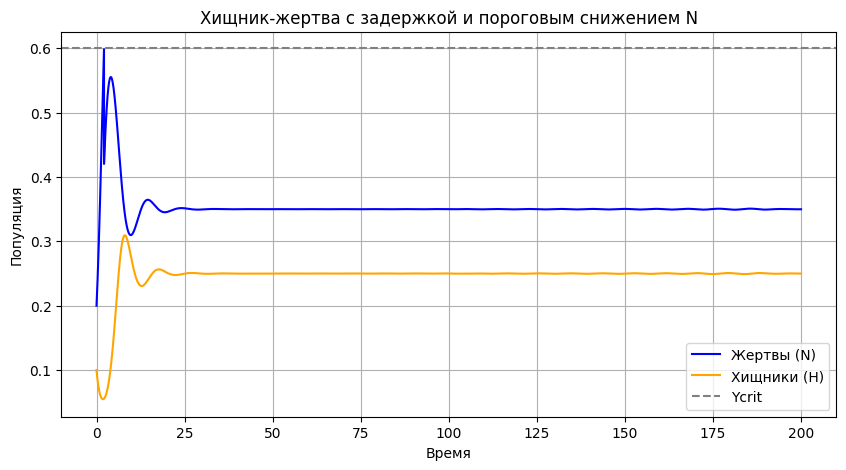

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from ddeint import ddeint

# Параметры
r, K, a, b, d = 1, 1, 2, 1, 1
Ycrit = 1.2 * d / (a * b)  # 0.6
tau1, tau2 = 0.2, 0.2
yini = np.array([0.2, 0.1])
tt = np.linspace(0, 200, 20000)

# История
def history(t):
    return yini

# DDE система без сброса
def model(Y, t):
    N_now, H_now = Y(t)
    N_tau1, _ = Y(t - tau1)
    N_tau2, H_tau2 = Y(t - tau2)

    dNdt = r * N_now * (1 - N_tau1 / K) - a * N_now * H_now
    dHdt = a * b * N_tau2 * H_tau2 - d * H_now

    return np.array([dNdt, dHdt])

# Решаем
sol = ddeint(model, history, tt)

#  Постобработка: вручную снижаем N(t), если > Ycrit
N, H = sol[:, 0].copy(), sol[:, 1]

for i in range(1, len(tt)):
    if N[i - 1] < Ycrit and N[i] >= Ycrit:
        N[i:] *= 0.7  # уменьшить на 30% с текущего момента

# Визуализация
plt.figure(figsize=(10, 5))
plt.plot(tt, N, label='Жертвы (N)', color='blue')
plt.plot(tt, H, label='Хищники (H)', color='orange')
plt.axhline(Ycrit, color='gray', linestyle='--', label='Ycrit')
plt.title("Хищник-жертва с задержкой и пороговым снижением N")
plt.xlabel("Время")
plt.ylabel("Популяция")
plt.legend()
plt.grid(True)
plt.show()


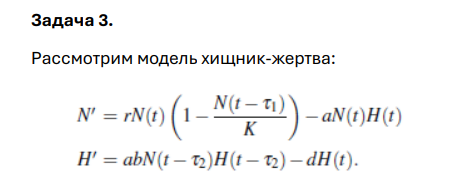
Где:

𝑁
(
𝑡
)
N(t) — популяция жертв,

𝐻
(
𝑡
)
H(t) — популяция хищников,

𝜏
1
τ
1
​
 ,
𝜏
2
τ
2
​
  — запаздывание в реакции жертв и хищников соответственно,

𝑟
,
𝐾
r,K — рост и вместимость среды для жертв (логистическая модель),

𝑎
,
𝑏
,
𝑑
a,b,d — параметры взаимодействия и смертности.



задача 4 PCA

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


evec_file = "/content/v54.1.p1_1240K_public.evec"


df = pd.read_csv(evec_file, delim_whitespace=True, skiprows=1, header=None)


df.columns = ['ID'] + [f'PC{i}' for i in range(1, 11)] + ['Label']


plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x='PC1', y='PC2', hue='Label', s=50, alpha=0.8, edgecolor='k')
plt.title('PCA: PC1 vs PC2')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


<ipython-input-2-174025dc3683>:9: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(evec_file, delim_whitespace=True, skiprows=1, header=None)
<ipython-input-2-174025dc3683>:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [ ]:
!head /content/v54.1.p1_1240K_public.evec


           #eigvals:     3.738     3.350     2.790     2.656     2.559     2.500     1.917     1.565     1.448     1.385 
Ne30_genotyping_noUDG    -0.0412     -0.0076      0.0548     -0.0068      0.0345     -0.0054     -0.0870      0.1172      0.0052     -0.2002  China_AmurRiver_EarlyN
Ne61_genotyping_noUDG    -0.0516      0.0088      0.0159      0.0056      0.0429     -0.0119     -0.0154      0.0326      0.0026     -0.0662  China_AmurRiver_BA
Ne35_genotyping_noUDG    -0.0435     -0.0100      0.0555      0.0028      0.0342     -0.0032     -0.0962      0.1239      0.0047     -0.2093  China_AmurRiver_EarlyN
              I17622     0.0315     -0.0023     -0.0180      0.0377     -0.0591      0.0065     -0.0051      0.0128      0.0188      0.0004  Albania_BA_IA_lc
              I13833     0.0095      0.0045      0.0064      0.0054     -0.0019      0.0008     -0.0056      0.0095     -0.0016     -0.0144  Albania_EarlyModern_oCaucasus
               I3931     0.0266     -0.0133     -0.0037   

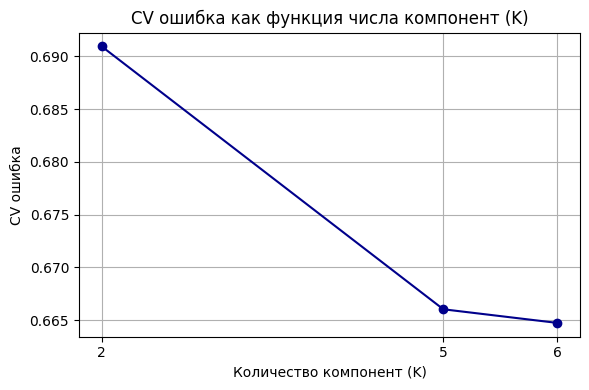

In [ ]:
import matplotlib.pyplot as plt

# Данные
K_values = [2, 5, 6]
cv_errors = [0.69094, 0.66603, 0.66474]

# График
plt.figure(figsize=(6, 4))
plt.plot(K_values, cv_errors, marker='o', color='darkblue')
plt.xticks(K_values)
plt.xlabel("Количество компонент (K)")
plt.ylabel("CV ошибка")
plt.title("CV ошибка как функция числа компонент (K)")
plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-1-2681007222>:6: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  q = pd.read_csv("/content/K6_ancestry_proportions.Q", delim_whitespace=True, header=None)
<ipython-input-1-2681007222>:7: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  meta = pd.read_csv("v54.1.ind", delim_whitespace=True, header=None)


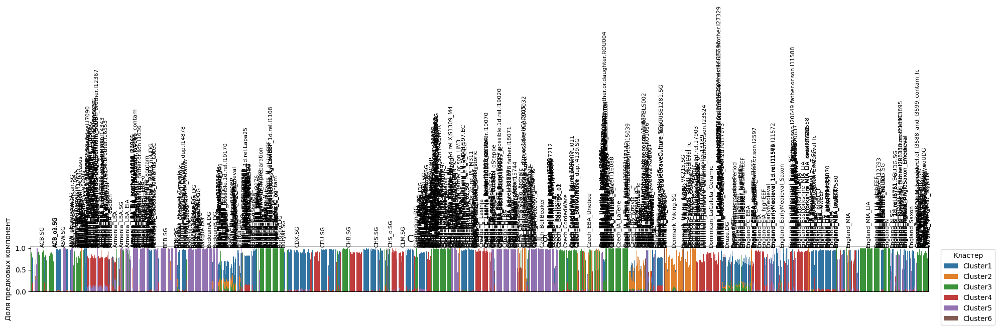

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


q = pd.read_csv("/content/K6_ancestry_proportions.Q", delim_whitespace=True, header=None)
meta = pd.read_csv("v54.1.ind", delim_whitespace=True, header=None)

# Установка K
K = 6
q.columns = [f"Cluster{i+1}" for i in range(K)]
q["Sample"] = meta[0]
q["Population"] = meta[2]

# Преобразование в длинный формат
q_long = q.melt(id_vars=["Sample", "Population"], var_name="Cluster", value_name="Proportion")

# Упорядочим сэмплы по популяциям
sample_order = q.groupby("Sample")["Population"].first().sort_values().index
q_long["Sample"] = pd.Categorical(q_long["Sample"], categories=sample_order, ordered=True)

# Строим barplot
plt.figure(figsize=(20, 6))
sns.barplot(data=q_long, x="Sample", y="Proportion", hue="Cluster", dodge=False, edgecolor=None)
plt.title("Структура популяций (K=6)", fontsize=14)
plt.xlabel("")
plt.ylabel("Доля предковых компонент")
plt.xticks([], [])  # Убираем подписи индивидов
plt.legend(title="Кластер", bbox_to_anchor=(1.01, 1), loc="upper left")


# Получим порядок индивидов и популяций
sample_pop = q[["Sample", "Population"]].set_index("Sample").loc[sample_order]
population_labels = []
tick_positions = []

last_pop = None
start_idx = 0

for i, (sample, pop) in enumerate(sample_pop.itertuples()):
    if pop != last_pop:
        if last_pop is not None:
            center = (start_idx + i - 1) / 2
            population_labels.append(last_pop)
            tick_positions.append(center)
        start_idx = i
        last_pop = pop

# Последняя популяция
center = (start_idx + len(sample_pop) - 1) / 2
population_labels.append(last_pop)
tick_positions.append(center)

# Добавим подписи
for pos, label in zip(tick_positions, population_labels):
    plt.text(pos, 1.02, label, ha='center', va='bottom', fontsize=8, rotation=90)

plt.tight_layout()
plt.show()


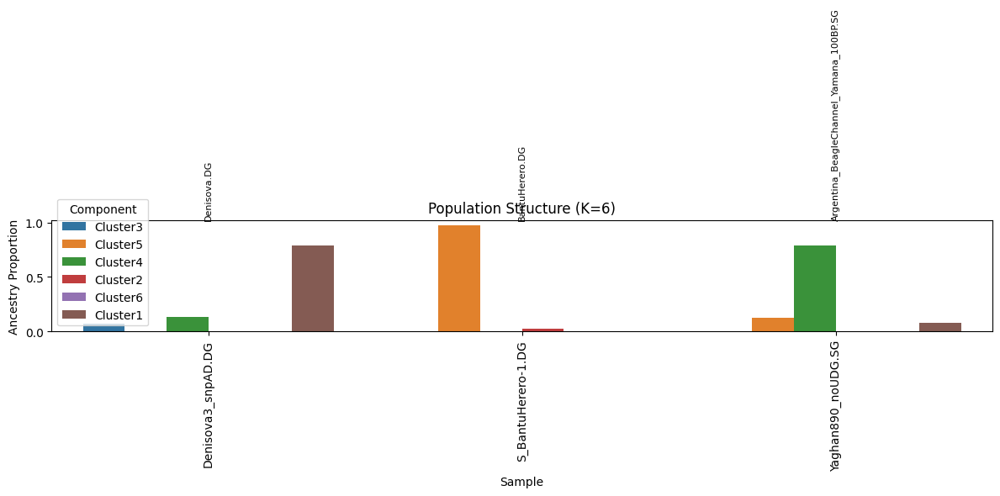

In [ ]:



# Загрузка файлов
q = pd.read_csv(qfile, sep="\s+", header=None)
meta = pd.read_csv(indfile, sep="\s+", header=None)

# Названия колонок ADMIXTURE-компонент
K = q.shape[1]
q.columns = [f"Cluster{i+1}" for i in range(K)]
q["Sample"] = meta[0]
q["Population"] = meta[2]

# Выбор нужных сэмплов
selected_samples = [
    'Denisova3_snpAD.DG', 'S_Khomani_San-1.DG', 'S_BantuHerero-1.DG',
    'France_Iboussieres25_1', 'Estonia_BA.SG', 'Japan_Jomon.SG',
    'China_AmurRiver_EarlyN', 'Russia_AfontovaGora3', 'Russia_Kolyma_M.SG',
    'Yaghan890_noUDG.SG', 'Iran_GanjDareh_N', 'Turkey_Boncuklu_N',
    'S_Khonda_Dora-1.DG', 'Kazakhstan_EBA_Yamnaya.SG'
]

q_filtered = q[q["Sample"].isin(selected_samples)].copy()

# Преобразование в длинный формат
q_long = q_filtered.melt(
    id_vars=["Sample", "Population", "Order"],
    var_name="Ancestry", value_name="Proportion"
)


plt.figure(figsize=(12, 6))
sns.barplot(
    data=q_long.sort_values("Order"),
    x="Sample", y="Proportion", hue="Ancestry"
)
plt.title("Population Structure (K=6)")
plt.ylabel("Ancestry Proportion")
plt.xticks(rotation=90)


pop_labels = q_filtered.sort_values("Order")["Population"].values
for i, pop in enumerate(pop_labels):
    plt.text(i, 1.02, pop, ha='center', va='bottom', rotation=90, fontsize=8)

plt.tight_layout()
plt.legend(title="Component")
plt.show()


In [ ]:
!head /content/v54.1.p1_1240K_public.evec

           #eigvals:     3.738     3.350     2.790     2.656     2.559     2.500     1.917     1.565     1.448     1.385 
Ne30_genotyping_noUDG    -0.0412     -0.0076      0.0548     -0.0068      0.0345     -0.0054     -0.0870      0.1172      0.0052     -0.2002  China_AmurRiver_EarlyN
Ne61_genotyping_noUDG    -0.0516      0.0088      0.0159      0.0056      0.0429     -0.0119     -0.0154      0.0326      0.0026     -0.0662  China_AmurRiver_BA
Ne35_genotyping_noUDG    -0.0435     -0.0100      0.0555      0.0028      0.0342     -0.0032     -0.0962      0.1239      0.0047     -0.2093  China_AmurRiver_EarlyN
              I17622     0.0315     -0.0023     -0.0180      0.0377     -0.0591      0.0065     -0.0051      0.0128      0.0188      0.0004  Albania_BA_IA_lc
              I13833     0.0095      0.0045      0.0064      0.0054     -0.0019      0.0008     -0.0056      0.0095     -0.0016     -0.0144  Albania_EarlyModern_oCaucasus
               I3931     0.0266     -0.0133     -0.0037   